In [102]:
pip install prophet


Note: you may need to restart the kernel to use updated packages.


In [103]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import statsmodels.api as sm
import numpy as np
from statsmodels.tsa.stattools import adfuller
from statsmodels.tsa.statespace.sarimax import SARIMAX
from itertools import product
from sklearn.metrics import mean_absolute_error, mean_squared_error
import warnings
from statsmodels.tsa.arima.model import ARIMA
import itertools
from prophet import Prophet
from statsmodels.tsa.holtwinters import ExponentialSmoothing

In [104]:
# Fill categorical missing values with 'Unknown'
df = pd.read_csv('cleaned_data_dropped.csv',low_memory=False)
categorical_cols = df.select_dtypes(include=['object']).columns
print(categorical_cols)

Index(['FACILITY NAME', 'ST', 'INDUSTRY SECTOR', 'CHEMICAL',
       'CLEAN AIR ACT CHEMICAL', 'CLASSIFICATION', 'METAL', 'METAL CATEGORY',
       'CARCINOGEN', 'PBT', 'PFAS', 'UNIT OF MEASURE'],
      dtype='object')


In [145]:
df.isnull().sum()

YEAR                               0
FACILITY NAME                      0
ST                                 0
INDUSTRY SECTOR CODE               0
INDUSTRY SECTOR                    0
CHEMICAL                           0
CLEAN AIR ACT CHEMICAL          6736
CLASSIFICATION                  6736
METAL                           6736
METAL CATEGORY                  6736
CARCINOGEN                      6736
PBT                             6736
PFAS                            6736
UNIT OF MEASURE                 6736
FUGITIVE AIR                       0
STACK AIR                          0
WATER                              0
UNDERGROUND                        0
LANDFILLS                          0
LAND TREATMENT                     0
SURFACE IMPNDMNT                   0
OTHER DISPOSAL                     0
ON-SITE RELEASE TOTAL              0
POTW - TRNS RLSE                   0
POTW - TRNS TRT                    0
POTW - TOTAL TRANSFERS             0
OFF-SITE RELEASE TOTAL             0
O

In [143]:
# Aggregate by year (if not already aggregated)
time_series_data = df.groupby('YEAR')['TOTAL RELEASES'].sum().reset_index()

# Ensure the YEAR column is a datetime type
time_series_data['YEAR'] = pd.to_datetime(time_series_data['YEAR'], format='%Y')
time_series_data_sam = time_series_data.copy()
# Step 1: Check stationarity and transform if needed
time_series_data['TOTAL RELEASES_diff'] = time_series_data['TOTAL RELEASES'].diff().dropna()

# ADF test for stationarity
adf_test = adfuller(time_series_data['TOTAL RELEASES_diff'].dropna())
print("ADF Statistic:", adf_test[0])
print("p-value:", adf_test[1])
outliers_detect = time_series_data.copy()
# Set YEAR as the index for time-series analysis
time_series_data.set_index('YEAR', inplace=True)

# Display the data
print(time_series_data.head())
print(time_series_data.columns)
print(outliers_detect.columns)

ADF Statistic: -4.696490540279932
p-value: 8.543953993527031e-05
            TOTAL RELEASES  TOTAL RELEASES_diff
YEAR                                           
2003-01-01    4.577736e+09                  NaN
2004-01-01    4.331598e+09        -2.461371e+08
2005-01-01    4.466363e+09         1.347647e+08
2006-01-01    4.456620e+09        -9.743215e+06
2007-01-01    4.249822e+09        -2.067978e+08
Index(['TOTAL RELEASES', 'TOTAL RELEASES_diff'], dtype='object')
Index(['YEAR', 'TOTAL RELEASES', 'TOTAL RELEASES_diff'], dtype='object')


In [144]:
time_series_data_sam

,YEAR,TOTAL RELEASES
0,2003-01-01,4.577736e+09
1,2004-01-01,4.331598e+09
2,2005-01-01,4.466363e+09
3,2006-01-01,4.456620e+09
4,2007-01-01,4.249822e+09
5,2008-01-01,3.975131e+09
6,2009-01-01,3.433271e+09
7,2010-01-01,3.846183e+09
8,2011-01-01,4.145959e+09
9,2012-01-01,3.671236e+09


In [112]:
time_series_data

,TOTAL RELEASES,TOTAL RELEASES_diff
YEAR,,
2003-01-01,4.577736e+09,NaN
2004-01-01,4.331598e+09,-2.461371e+08
2005-01-01,4.466363e+09,1.347647e+08
2006-01-01,4.456620e+09,-9.743215e+06
2007-01-01,4.249822e+09,-2.067978e+08
2008-01-01,3.975131e+09,-2.746915e+08
2009-01-01,3.433271e+09,-5.418592e+08
2010-01-01,3.846183e+09,4.129120e+08
2011-01-01,4.145959e+09,2.997759e+08


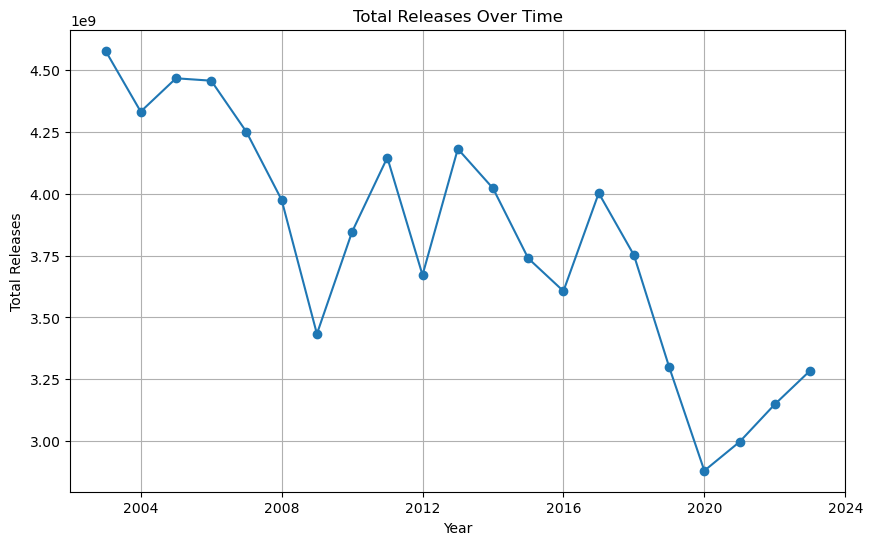

In [113]:
# Plot the time series
plt.figure(figsize=(10, 6))
plt.plot(time_series_data.index, time_series_data['TOTAL RELEASES'], marker='o')
plt.title('Total Releases Over Time')
plt.xlabel('Year')
plt.ylabel('Total Releases')
plt.grid()
plt.show()


In [114]:
# Calculate IQR
Q1 = time_series_data['TOTAL RELEASES'].quantile(0.25)
Q3 = time_series_data['TOTAL RELEASES'].quantile(0.75)
IQR = Q3 - Q1

# Identify outliers
lower_bound = Q1 - 1.5 * IQR
upper_bound = Q3 + 1.5 * IQR
outliers = time_series_data[(time_series_data['TOTAL RELEASES'] < lower_bound) | 
                            (time_series_data['TOTAL RELEASES'] > upper_bound)]
print("Q1", Q1)
print("Q3", Q3)
print("IQR", IQR)
# print(time_series_data['TOTAL RELEASES'])
print("Outliers based on IQR:")
print(outliers)


Q1 3433271392.94323
Q3 4181039781.849695
IQR 747768388.906465
Outliers based on IQR:
Empty DataFrame
Columns: [TOTAL RELEASES, TOTAL RELEASES_diff]
Index: []


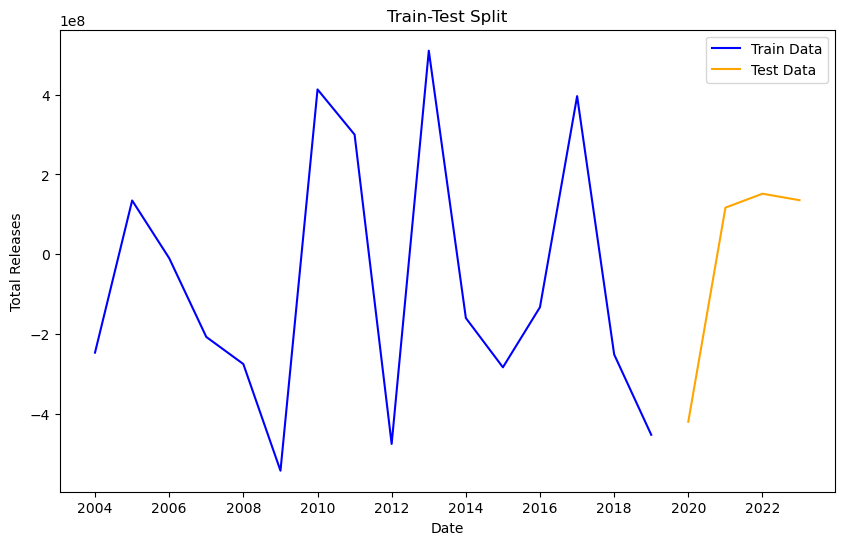

In [115]:
# Define split ratio (e.g., 80% train, 20% test)
split_ratio = 0.8
split_index = int(len(time_series_data['TOTAL RELEASES_diff'].dropna()) * split_ratio)

# Split into train and test
train_data = time_series_data['TOTAL RELEASES_diff'].dropna()[:split_index]
test_data = time_series_data['TOTAL RELEASES_diff'].dropna()[split_index:]

# Define test_start and test_end
test_start = test_data.index[0]
test_end = test_data.index[-1]
# Extract actual values from the time series data for the test period
actual_values = time_series_data['TOTAL RELEASES_diff'].dropna()[test_start:test_end]

plt.figure(figsize=(10, 6))
plt.plot(train_data, label='Train Data', color='blue')
plt.plot(test_data, label='Test Data', color='orange')
plt.xlabel('Date')
plt.ylabel('Total Releases')
plt.title('Train-Test Split')
plt.legend()
plt.show()


In [116]:
def error_percentage(y_true, y_pred):
    """
    Calculate the error percentage using NumPy.

    Parameters:
    y_true (array-like): Actual values
    y_pred (array-like): Predicted values

    Returns:
    float: Error percentage
    """
    y_true, y_pred = np.array(y_true), np.array(y_pred)
    errors = np.abs((y_true - y_pred) / y_true)
    return np.mean(errors) * 100

In [117]:

warnings.filterwarnings('ignore')

# Define parameter grid for SARIMA
p = d = q = range(0, 3)  # Non-seasonal params
P = D = Q = range(0, 2)  # Seasonal params
s = [12]  # Seasonal period (yearly data)

# Create all combinations
param_grid = list(product(p, d, q, P, D, Q, s))

# Track best parameters
best_rmse_SARIMA = float("inf")
best_maep_SARIMA = float("inf")
best_params = None

# Grid search
for params in param_grid:
    try:
        sarima_model = SARIMAX(time_series_data['TOTAL RELEASES_diff'].dropna()[:-3],
                               order=(params[0], params[1], params[2]),
                               seasonal_order=(params[3], params[4], params[5], params[6]),
                               enforce_stationarity=False,
                               enforce_invertibility=False)
        results = sarima_model.fit(disp=False)
        # Predict and evaluate
        predictions = results.predict(start=test_start, end=test_end)
        rmse = np.sqrt(mean_squared_error(actual_values, predictions))
        maep = error_percentage(actual_values, predictions)
        if rmse < best_rmse_SARIMA:
            best_rmse_SARIMA = rmse
            best_params = params
            best_maep_SARIMA = maep
    except Exception as e:
        continue

p, d, q, P, D, Q, s = best_params
print(f'Best SARIMA Parameters: {best_params}')
print(f'Best RMSE: {best_rmse_SARIMA}')
print(f'Best MAEP: {best_maep_SARIMA}')


Best SARIMA Parameters: (2, 0, 2, 0, 0, 0, 12)
Best RMSE: 161324404.35260847
Best MAEP: 99.41683849138722


In [118]:
# Refit the model using the best parameters
best_model = SARIMAX(
    time_series_data['TOTAL RELEASES_diff'].dropna(), 
    order=(p, d, q),        # (p, d, q)
    seasonal_order=(P, D, Q, s),  # (P, D, Q, s)
    enforce_stationarity=False, 
    enforce_invertibility=False
)

best_model_fitted = best_model.fit(disp=False)
print(best_model_fitted.summary())

# Predict on the test set
predicted_values = best_model_fitted.predict(start=test_start, end=test_end)
rmse = np.sqrt(mean_squared_error(actual_values, predicted_values))
print(f"Test RMSE: {rmse}")
print(actual_values)
print(predicted_values)



                                SARIMAX Results                                
Dep. Variable:     TOTAL RELEASES_diff   No. Observations:                   20
Model:                SARIMAX(2, 0, 2)   Log Likelihood                -352.244
Date:                 Fri, 22 Nov 2024   AIC                            714.489
Time:                         14:23:53   BIC                            718.655
Sample:                     01-01-2004   HQIC                           714.903
                          - 01-01-2023                                         
Covariance Type:                   opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1          0.1217      1.357      0.090      0.929      -2.537       2.781
ar.L2          0.2387      1.444      0.165      0.869      -2.591       3.068
ma.L1         -1.1081      1.505     -0.736 

2024-01-01    2.950301e+08
2025-01-01    1.586667e+08
2026-01-01    8.972895e+07
2027-01-01    4.879146e+07
2028-01-01    2.735488e+07
Name: predicted_mean, dtype: float64
                 YEAR      FORECAST
2024-01-01 2024-12-31  2.950301e+08
2025-01-01 2025-12-31  1.586667e+08
2026-01-01 2026-12-31  8.972895e+07
2027-01-01 2027-12-31  4.879146e+07
2028-01-01 2028-12-31  2.735488e+07


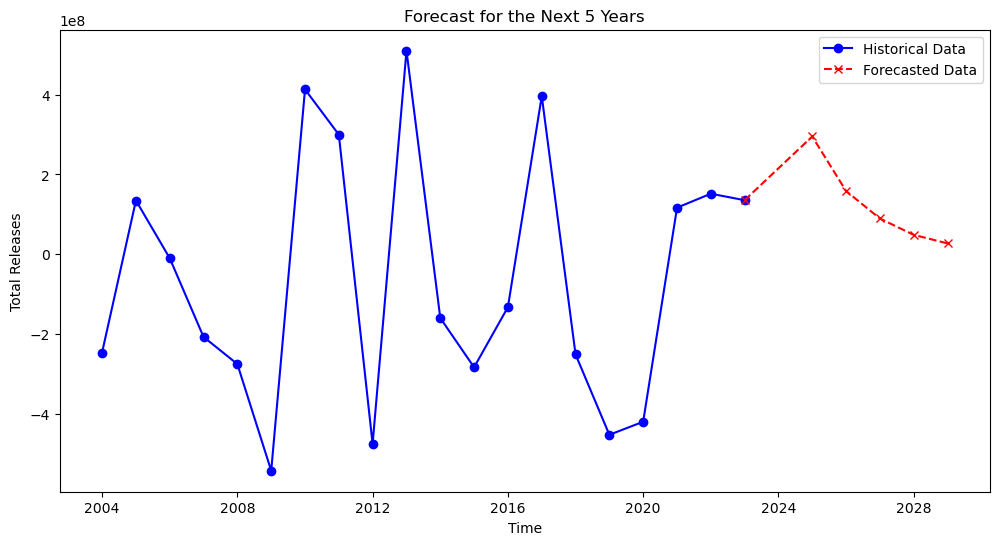

In [119]:
# Forecast for the next 5 years (60 months)
forecast_steps = 5 * 12  # 5 years
forecast = best_model_fitted.forecast(steps=forecast_steps)

# Create a date range for the forecast
forecast_index = pd.date_range(start='2024-01-01', periods=forecast_steps, freq='MS')
forecast_series = pd.Series(forecast, index=forecast_index)
forecast_series = forecast_series.dropna()
# Print the forecasted values
print(forecast_series)
historical_df = time_series_data['TOTAL RELEASES_diff'].dropna().reset_index()
historical_df.columns = ['YEAR', 'ACTUAL']
# Display forecasted values
future_years = pd.date_range(start=time_series_data['TOTAL RELEASES_diff'].dropna().index[-1] + pd.DateOffset(years=1), periods=5, freq='Y')
forecast_df = pd.DataFrame({'YEAR': future_years, 'FORECAST': forecast_series})
print(forecast_df)

plt.figure(figsize=(12, 6))
# Plot historical data
plt.plot(historical_df['YEAR'], historical_df['ACTUAL'], label='Historical Data', marker='o', color='blue')
# Plot forecasted data
plt.plot([historical_df['YEAR'].iloc[-1]] + forecast_df['YEAR'].tolist(), 
         [historical_df['ACTUAL'].iloc[-1]] + forecast_df['FORECAST'].tolist(), 
         label='Forecasted Data', marker='x', linestyle='--', color='red')
plt.title('Forecast for the Next 5 Years')
plt.xlabel('Time')
plt.ylabel('Total Releases')
plt.legend()
plt.show()


In [120]:
# Inverse the differencing to return to the original scale
last_value = time_series_data['TOTAL RELEASES'].iloc[-1]
forecast_original_scale = forecast_series.cumsum() + last_value  
forecast_original_scale

2024-01-01    3.579610e+09
2025-01-01    3.738276e+09
2026-01-01    3.828005e+09
2027-01-01    3.876797e+09
2028-01-01    3.904152e+09
Name: predicted_mean, dtype: float64

                 YEAR      FORECAST
2024-01-01 2024-12-31  3.579610e+09
2025-01-01 2025-12-31  3.738276e+09
2026-01-01 2026-12-31  3.828005e+09
2027-01-01 2027-12-31  3.876797e+09
2028-01-01 2028-12-31  3.904152e+09


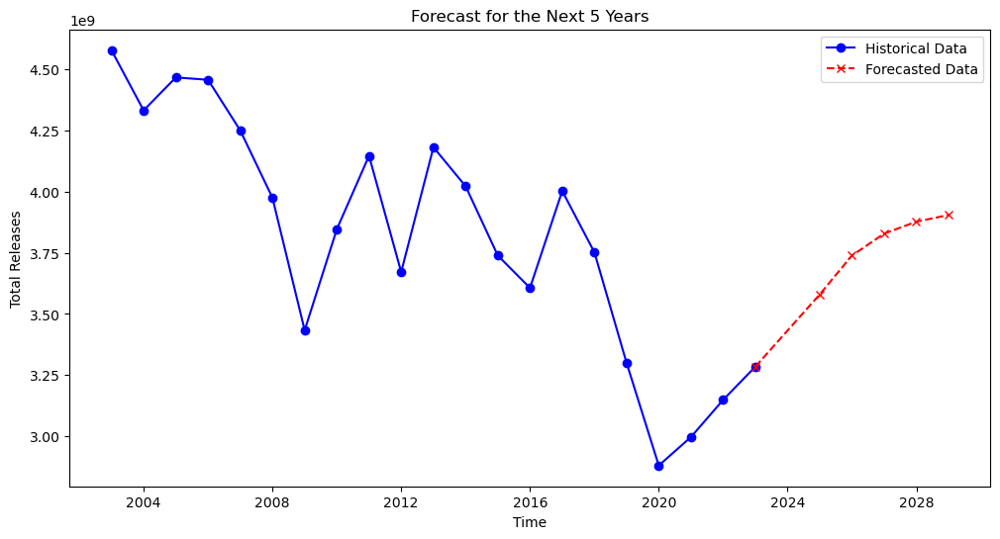

In [121]:
historical_df = time_series_data['TOTAL RELEASES'].dropna().reset_index()
historical_df.columns = ['YEAR', 'ACTUAL']
# Display forecasted values
future_years = pd.date_range(start=time_series_data['TOTAL RELEASES'].dropna().index[-1] + pd.DateOffset(years=1), periods=5, freq='Y')
forecast_df = pd.DataFrame({'YEAR': future_years, 'FORECAST': forecast_original_scale})
print(forecast_df)

plt.figure(figsize=(12, 6))
# Plot historical data
plt.plot(historical_df['YEAR'], historical_df['ACTUAL'], label='Historical Data', marker='o', color='blue')

# Plot forecasted data
plt.plot([historical_df['YEAR'].iloc[-1]] + forecast_df['YEAR'].tolist(), 
         [historical_df['ACTUAL'].iloc[-1]] + forecast_df['FORECAST'].tolist(), 
         label='Forecasted Data', marker='x', linestyle='--', color='red')

plt.title('Forecast for the Next 5 Years')
plt.xlabel('Time')
plt.ylabel('Total Releases')
plt.legend()
plt.show()

In [122]:

# Define the p, d, q parameter ranges
p = d = q = range(0, 3)
pdq = list(itertools.product(p, d, q))

best_aic = float('inf')
best_pdq = None

for param in pdq:
    try:
        model = ARIMA(time_series_data['TOTAL RELEASES_diff'].dropna(), order=param)
        model_fit = model.fit()
        if model_fit.aic < best_aic:
            best_aic = model_fit.aic
            best_pdq = param
    except:
        continue

print(f"Best ARIMA model order: {best_pdq} with AIC: {best_aic}")


Best ARIMA model order: (0, 2, 2) with AIC: 771.1946883227586


In [123]:
# Define the parameter grid for ARIMA (p, d, q)
p = d = q = range(0, 3)
pdq = list(itertools.product(p, d, q))

best_rmse_ARIMA = float('inf')
best_pdq = None

for param in pdq:
    try:
        model = ARIMA(time_series_data['TOTAL RELEASES_diff'].dropna()[:-4], order=param)
        model_fit = model.fit()

        # Predict on the train set (or test set if available)
        predicted_values = model_fit.predict(start=test_start, end=test_end)

        # Calculate RMSE
        rmse = np.sqrt(mean_squared_error(actual_values, predicted_values))
        # print(rmse)
        # Update best model if RMSE is better
        if rmse < best_rmse_ARIMA:
            best_rmse_ARIMA = rmse
            best_pdq = param
    except Exception as e:
        print(f"Error with parameters {param}: {e}")
        continue

print(f"Best ARIMA model order: {best_pdq} with RMSE: {best_rmse_ARIMA}")


Best ARIMA model order: (0, 0, 0) with RMSE: 251968051.66591877


In [124]:
# Fit the model with the best parameters
best_model = ARIMA(time_series_data['TOTAL RELEASES_diff'].dropna(), order=best_pdq)
best_model_fit = best_model.fit()

# Print the model summary
print(best_model_fit.summary())


                                SARIMAX Results                                
Dep. Variable:     TOTAL RELEASES_diff   No. Observations:                   20
Model:                           ARIMA   Log Likelihood                -439.922
Date:                 Fri, 22 Nov 2024   AIC                            883.844
Time:                         14:23:54   BIC                            885.835
Sample:                     01-01-2004   HQIC                           884.233
                          - 01-01-2023                                         
Covariance Type:                   opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
const      -6.466e+07   1.39e+09     -0.047      0.963   -2.79e+09    2.66e+09
sigma2      1.931e+18      0.030   6.45e+19      0.000    1.93e+18    1.93e+18
Ljung-Box (L1) (Q):                   0.39  

2024-01-01   -6.465781e+07
2025-01-01   -6.465781e+07
2026-01-01   -6.465781e+07
2027-01-01   -6.465781e+07
2028-01-01   -6.465781e+07
Freq: YS-JAN, Name: predicted_mean, dtype: float64
                 YEAR      FORECAST
2024-01-01 2024-12-31 -6.465781e+07
2025-01-01 2025-12-31 -6.465781e+07
2026-01-01 2026-12-31 -6.465781e+07
2027-01-01 2027-12-31 -6.465781e+07
2028-01-01 2028-12-31 -6.465781e+07


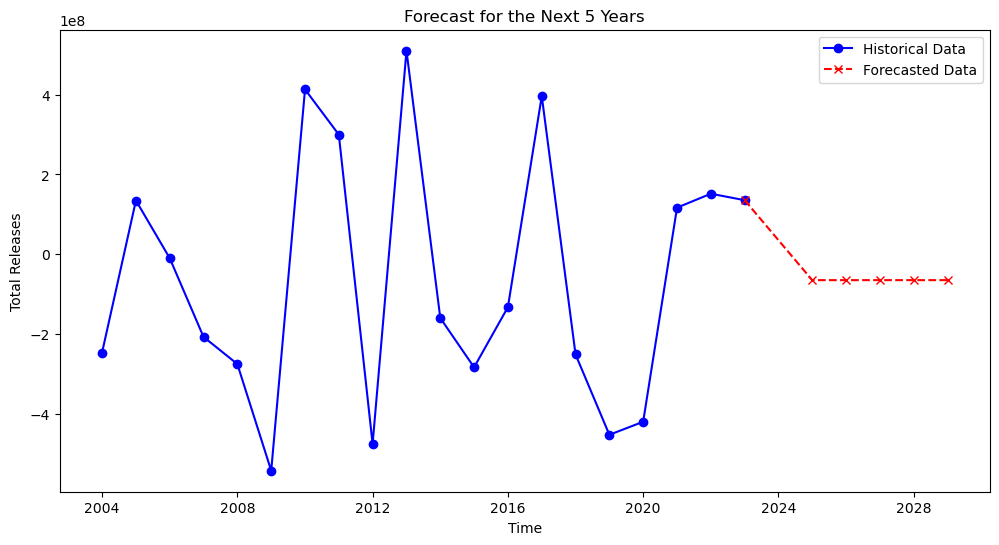

In [125]:
# Fit the ARIMA model with the best parameters (best_pdq)
model = ARIMA(time_series_data['TOTAL RELEASES_diff'].dropna(), order=best_pdq)  # Use the best (p, d, q) found during tuning
model_fit = model.fit()

forecast = model_fit.forecast(steps=5)
print(forecast)

historical_df = time_series_data['TOTAL RELEASES_diff'].dropna().reset_index()
historical_df.columns = ['YEAR', 'ACTUAL']
# Display forecasted values
future_years = pd.date_range(start=time_series_data['TOTAL RELEASES_diff'].dropna().index[-1] + pd.DateOffset(years=1), periods=5, freq='Y')
forecast_df = pd.DataFrame({'YEAR': future_years, 'FORECAST': forecast})
print(forecast_df)
import matplotlib.pyplot as plt

plt.figure(figsize=(12, 6))


# Plot historical data
plt.plot(historical_df['YEAR'], historical_df['ACTUAL'], label='Historical Data', marker='o', color='blue')

# Plot forecasted data
plt.plot([historical_df['YEAR'].iloc[-1]] + forecast_df['YEAR'].tolist(), 
         [historical_df['ACTUAL'].iloc[-1]] + forecast_df['FORECAST'].tolist(), 
         label='Forecasted Data', marker='x', linestyle='--', color='red')

plt.title('Forecast for the Next 5 Years')
plt.xlabel('Time')
plt.ylabel('Total Releases')
plt.legend()
plt.show()


In [126]:
# Inverse the differencing to return to the original scale
last_value = time_series_data['TOTAL RELEASES'].iloc[-1]
forecast_original_scale = forecast.cumsum() + last_value
forecast_original_scale

2024-01-01    3.219922e+09
2025-01-01    3.155264e+09
2026-01-01    3.090606e+09
2027-01-01    3.025948e+09
2028-01-01    2.961290e+09
Freq: YS-JAN, Name: predicted_mean, dtype: float64

                 YEAR      FORECAST
2024-01-01 2024-12-31  3.219922e+09
2025-01-01 2025-12-31  3.155264e+09
2026-01-01 2026-12-31  3.090606e+09
2027-01-01 2027-12-31  3.025948e+09
2028-01-01 2028-12-31  2.961290e+09


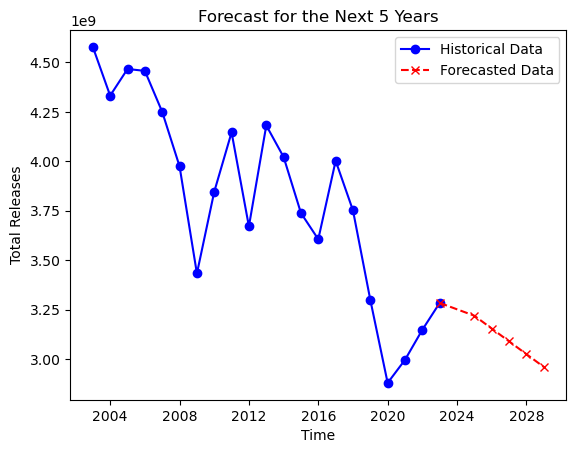

In [127]:
historical_df = time_series_data['TOTAL RELEASES'].dropna().reset_index()
historical_df.columns = ['YEAR', 'ACTUAL']
# Display forecasted values
future_years = pd.date_range(start=time_series_data['TOTAL RELEASES'].dropna().index[-1] + pd.DateOffset(years=1), periods=5, freq='Y')
forecast_df = pd.DataFrame({'YEAR': future_years, 'FORECAST': forecast_original_scale})
print(forecast_df)
# Plot historical data
plt.plot(historical_df['YEAR'], historical_df['ACTUAL'], label='Historical Data', marker='o', color='blue')

# Plot forecasted data
plt.plot([historical_df['YEAR'].iloc[-1]] + forecast_df['YEAR'].tolist(), 
         [historical_df['ACTUAL'].iloc[-1]] + forecast_df['FORECAST'].tolist(), 
         label='Forecasted Data', marker='x', linestyle='--', color='red')

plt.title('Forecast for the Next 5 Years')
plt.xlabel('Time')
plt.ylabel('Total Releases')
plt.legend()
plt.show()

In [128]:
# Rename columns for Prophet
prophet_data = outliers_detect.rename(columns={'YEAR': 'ds', 'TOTAL RELEASES': 'y'})
# Fit the model
model = Prophet()
model.fit(prophet_data)

# Generate predictions
forecast = model.predict(prophet_data)

# Residuals
prophet_data['residuals'] = prophet_data['y'] - forecast['yhat']

# Highlight outliers
outliers = prophet_data[prophet_data['residuals'].abs() > 3 * prophet_data['residuals'].std()]
print("Outliers detected by Prophet:")
print(outliers)
 

14:23:55 - cmdstanpy - INFO - Chain [1] start processing
14:23:55 - cmdstanpy - INFO - Chain [1] done processing


Outliers detected by Prophet:
Empty DataFrame
Columns: [ds, y, TOTAL RELEASES_diff, residuals]
Index: []


In [129]:
# Hyperparameter tuning for Prophet
best_rmse_prophet = float('inf')
best_prophet_params = None

# Hyperparameters for Prophet
changepoint_scales = [0.01, 0.1, 0.5]
seasonality_modes = ['additive', 'multiplicative']

# Assuming you have your time_series_data with 'TOTAL RELEASES'
# and you are working with the original time series (not differenced)
df_prophet = time_series_data[['TOTAL RELEASES_diff']].reset_index()
df_prophet.columns = ['ds', 'y']
# print(df_prophet[:-5])

for changepoint in changepoint_scales:
    for seasonality in seasonality_modes:
        try:
            # Create and fit the Prophet model
            model = Prophet(yearly_seasonality=True,changepoint_prior_scale=changepoint, seasonality_mode=seasonality)
            model.fit(df_prophet[:-5])

            # Forecast for the next 5 years (60 months)
            future = model.make_future_dataframe(periods=6, freq='Y',include_history=False)  # Forecasting for the next 5 years
            forecast = model.predict(future)
            # print(forecast_values)
            # Forecasted values
            forecast_values = forecast['yhat'][1:].values  # For the next 60 months
            print(forecast_values)

            # Compare with actual values (if available, for RMSE calculation)
            # You would compare these forecasted values with your test set if available
            # If no actual future values exist, this step can be skipped
            # Example assuming actual values for comparison (otherwise, remove this part):
            actual_values = time_series_data['TOTAL RELEASES_diff'][-5:]  # Adjust this as needed
            # print("--------------",(actual_values, forecast_values))
            rmse = np.sqrt(mean_squared_error(actual_values, forecast_values))
            # print("--------------")

            # Update best RMSE and parameters
            if rmse < best_rmse_prophet:
                best_rmse_prophet = rmse
                best_prophet_params = (changepoint, seasonality)

        except Exception as e:
            print(f"Error with Prophet params (changepoint={changepoint}, seasonality={seasonality}): {e}")
            continue

print(f"Best Prophet model with RMSE: {best_rmse_prophet} and parameters: {best_prophet_params}")


14:23:55 - cmdstanpy - INFO - Chain [1] start processing


14:23:55 - cmdstanpy - INFO - Chain [1] done processing
14:23:55 - cmdstanpy - INFO - Chain [1] start processing


[-7.11818901e+08 -3.32744534e+08 -4.54034084e+08 -5.74927882e+08
 -6.95273686e+08]


14:23:56 - cmdstanpy - INFO - Chain [1] done processing
14:23:56 - cmdstanpy - INFO - Chain [1] start processing
14:23:56 - cmdstanpy - INFO - Chain [1] done processing
14:23:56 - cmdstanpy - INFO - Chain [1] start processing
14:23:56 - cmdstanpy - INFO - Chain [1] done processing
14:23:56 - cmdstanpy - INFO - Chain [1] start processing


[-1.12559130e+09 -5.78453947e+08 -8.01207916e+08 -1.03678568e+09
 -1.28486963e+09]
[-7.11681696e+08 -3.32535274e+08 -4.53840564e+08 -5.74750185e+08
 -6.95111868e+08]
[-1.18015738e+09 -6.03813221e+08 -8.38935150e+08 -1.08814128e+09
 -1.35111943e+09]


14:23:56 - cmdstanpy - INFO - Chain [1] done processing
14:23:56 - cmdstanpy - INFO - Chain [1] start processing
14:23:56 - cmdstanpy - INFO - Chain [1] done processing


[-7.11377489e+08 -3.32057625e+08 -4.53401250e+08 -5.74349409e+08
 -6.94749765e+08]
[-1.18080908e+09 -6.03772218e+08 -8.38934530e+08 -1.08819769e+09
 -1.35125509e+09]
Best Prophet model with RMSE: 568639752.1339178 and parameters: (0.5, 'additive')


14:23:56 - cmdstanpy - INFO - Chain [1] start processing
14:23:56 - cmdstanpy - INFO - Chain [1] done processing


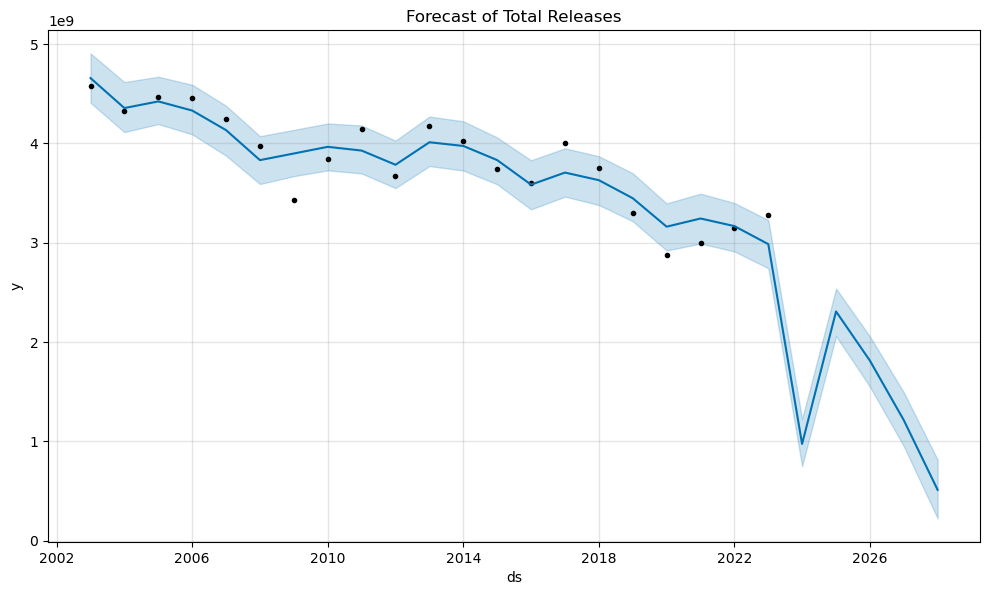

,ds,yhat,yhat_lower,yhat_upper
21,2023-12-31,9.737208e+08,7.494464e+08,1.225299e+09
22,2024-12-31,2.308059e+09,2.060198e+09,2.538912e+09
23,2025-12-31,1.812459e+09,1.550213e+09,2.056645e+09
24,2026-12-31,1.213219e+09,9.515405e+08,1.494124e+09
25,2027-12-31,5.111384e+08,2.230460e+08,8.144947e+08


In [130]:
time_series_prophet_data = time_series_data['TOTAL RELEASES'].dropna().copy()
# Prepare data for Prophet
prophet_data = time_series_prophet_data.reset_index()
prophet_data.columns = ['ds', 'y']  # Prophet requires 'ds' for date and 'y' for the target

# Initialize and fit the Prophet model
model = Prophet(changepoint_prior_scale=best_prophet_params[0], seasonality_mode=best_prophet_params[1],yearly_seasonality=True)
model.fit(prophet_data)

# Create a DataFrame for future years
future = model.make_future_dataframe(periods=5, freq='Y')  # Forecasting for the next 5 years
forecast = model.predict(future)

# Plot the forecast
model.plot(forecast)
plt.title('Forecast of Total Releases')
plt.show()

# Display forecasted values
forecast[['ds', 'yhat', 'yhat_lower', 'yhat_upper']].tail(5)


In [131]:
# Assuming 'time_series_data' has 'TOTAL RELEASES' column with yearly data
df_hw = time_series_data[['TOTAL RELEASES']][:-5]
trend_options = ['add', 'mul']
# Try fitting with no seasonality and additive seasonality
best_rmse_hw = float('inf')
best_hw_params = None

for trend in trend_options:
    for seasonal in [None, 'mul','add']:  # 'None' means no seasonality, 'add' means additive seasonality
        try:
            # Fit the Holt-Winters Exponential Smoothing model
            if seasonal:
                model = ExponentialSmoothing(df_hw, trend=trend, seasonal=seasonal,seasonal_periods=1)  # Yearly data, seasonal periods=1
            else:
                model = ExponentialSmoothing(df_hw, trend=trend, seasonal=None)  # No seasonality
            
            model_fit = model.fit()

            # Forecast for the next 5 years (5 values)
            forecast_steps = 5  # Forecasting 5 years ahead
            forecast_values = model_fit.forecast(forecast_steps)
            # print(forecast_values)
            # If actual future values are available, calculate RMSE
            # Assuming actual values exist in the future for comparison
            actual_values = time_series_data['TOTAL RELEASES'].values[-5:]  # Adjust this if you have real data
            rmse = np.sqrt(mean_squared_error(actual_values, forecast_values))

            # Update best RMSE and parameters
            if rmse < best_rmse_hw:
                best_rmse_hw = rmse
                best_hw_params = (trend, seasonal)

        except Exception as e:
            print(f"Error with Exponential Smoothing params (seasonal={seasonal}): {e}")
            continue

print(f"Best Holt-Winters model with RMSE: {best_rmse_hw} and parameters: {best_hw_params}")


Error with Exponential Smoothing params (seasonal=mul): seasonal_periods must be larger than 1.
Error with Exponential Smoothing params (seasonal=add): seasonal_periods must be larger than 1.
Error with Exponential Smoothing params (seasonal=mul): seasonal_periods must be larger than 1.
Error with Exponential Smoothing params (seasonal=add): seasonal_periods must be larger than 1.
Best Holt-Winters model with RMSE: 410150433.5347588 and parameters: ('mul', None)


In [132]:
# Fit Holt-Winters model (using additive trend and seasonality)
model = ExponentialSmoothing(time_series_data['TOTAL RELEASES'], trend=best_hw_params[0], seasonal=best_hw_params[1]).fit()

# Forecast the next 12 periods (e.g., months)
forecast = model.forecast(steps=5)
print(forecast)

2024-01-01    3.030442e+09
2025-01-01    2.967577e+09
2026-01-01    2.906015e+09
2027-01-01    2.845731e+09
2028-01-01    2.786697e+09
Freq: YS-JAN, dtype: float64


                 YEAR      FORECAST
2024-01-01 2024-12-31  3.030442e+09
2025-01-01 2025-12-31  2.967577e+09
2026-01-01 2026-12-31  2.906015e+09
2027-01-01 2027-12-31  2.845731e+09
2028-01-01 2028-12-31  2.786697e+09


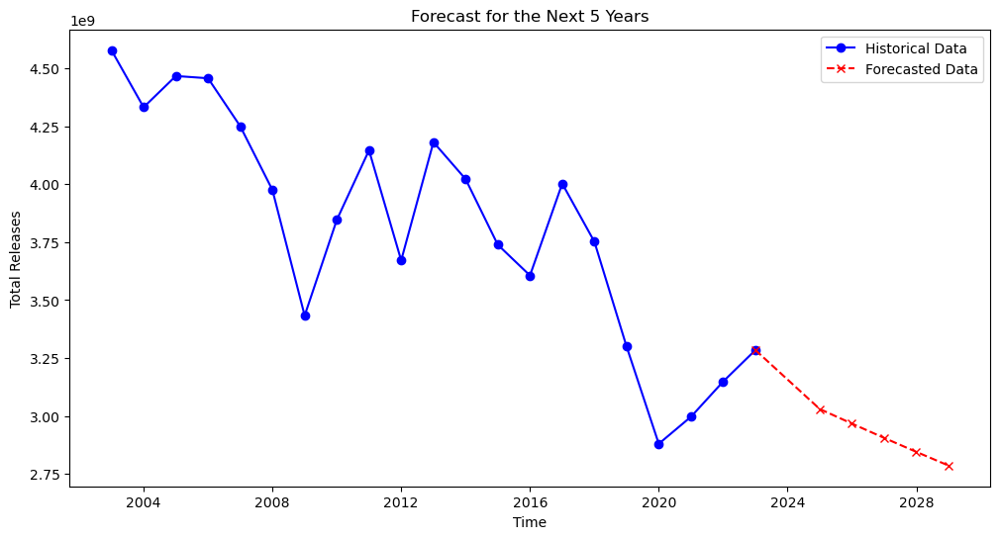

In [133]:
historical_df = time_series_data['TOTAL RELEASES'].dropna().reset_index()
historical_df.columns = ['YEAR', 'ACTUAL']
# Display forecasted values
future_years = pd.date_range(start=time_series_data['TOTAL RELEASES'].dropna().index[-1] + pd.DateOffset(years=1), periods=5, freq='Y')
forecast_df = pd.DataFrame({'YEAR': future_years, 'FORECAST': forecast})
print(forecast_df)
plt.figure(figsize=(12, 6))

# Plot historical data
plt.plot(historical_df['YEAR'], historical_df['ACTUAL'], label='Historical Data', marker='o', color='blue')

# Plot forecasted data
plt.plot([historical_df['YEAR'].iloc[-1]] + forecast_df['YEAR'].tolist(), 
         [historical_df['ACTUAL'].iloc[-1]] + forecast_df['FORECAST'].tolist(), 
         label='Forecasted Data', marker='x', linestyle='--', color='red')

plt.title('Forecast for the Next 5 Years')
plt.xlabel('Time')
plt.ylabel('Total Releases')
plt.legend()
plt.show()

In [134]:
pip install xgboost

Note: you may need to restart the kernel to use updated packages.


In [135]:
from xgboost import XGBRegressor
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_squared_error

# Prepare lagged features
def create_lag_features(data, lag=1):
    df = pd.DataFrame(data)
    for i in range(1, lag + 1):
        df[f'lag_{i}'] = df[0].shift(i)
    df = df.dropna()
    return df

# Lag settings
lag = 3  # Use the last 3 values to predict the next one
data_lagged = create_lag_features(time_series_data['TOTAL RELEASES_diff'].values, lag)
X = data_lagged.iloc[:, 1:].values
y = data_lagged.iloc[:, 0].values

# Train-test split
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)
print(X_test)
print(y_test)
# Hyperparameter tuning for XGBoost
best_rmse_xgb = float('inf')
best_xgb_params = None

# Hyperparameter grid
learning_rates = [0.01, 0.1, 0.2]
max_depths = [3, 5, 7, 9, 11, 13, 15]
n_estimators = [50, 100, 200, 400]

for lr in learning_rates:
    for depth in max_depths:
        for n in n_estimators:
            try:
                # Train XGBoost model
                model = XGBRegressor(learning_rate=lr, max_depth=depth, n_estimators=n, objective='reg:squarederror')
                model.fit(X_train, y_train)

                # Predict on test set
                y_pred = model.predict(X_test)
                rmse = np.sqrt(mean_squared_error(y_test, y_pred))

                # Update best RMSE and parameters
                if rmse < best_rmse_xgb:
                    best_rmse_xgb = rmse
                    best_xgb_params = (lr, depth, n)

            except Exception as e:
                print(f"Error with XGBoost params (lr={lr}, depth={depth}, n_estimators={n}): {e}")
                continue

print(f"Best XGBoost model with RMSE: {best_rmse_xgb} and parameters: {best_xgb_params}")



[[-9.74321476e+06  1.34764674e+08 -2.46137131e+08]
 [-2.06797846e+08 -9.74321476e+06  1.34764674e+08]
 [ 2.99775948e+08  4.12912005e+08 -5.41859234e+08]
 [ 1.16842489e+08 -4.19275352e+08 -4.51868835e+08]]
[-2.06797846e+08 -2.74691471e+08 -4.74723325e+08  1.51749520e+08]
Best XGBoost model with RMSE: 240358288.26739028 and parameters: (0.01, 3, 100)


In [136]:

# Forecast future values
last_lag = time_series_data['TOTAL RELEASES_diff'].values[-lag:]  # Last 'lag' values
model = XGBRegressor(learning_rate=best_xgb_params[0], max_depth=best_xgb_params[1], n_estimators=best_xgb_params[2], objective='reg:squarederror')
model.fit(X_train, y_train)
# print(last_lag)
future_forecasts = []
for _ in range(5):  # Forecast 5 future values
    input_data = last_lag[-lag:].reshape(1, -1)
    # print(input_data)
    prediction = model.predict(input_data)[0]
    future_forecasts.append(prediction)
    last_lag = np.append(last_lag, prediction)

print("Forecasted values for next 5 years:", future_forecasts)

Forecasted values for next 5 years: [-93768370.0, -93768370.0, -93768370.0, -93768370.0, -93768370.0]


In [137]:
# Inverse the differencing to return to the original scale
last_value = time_series_data['TOTAL RELEASES'].iloc[-1]
forecast_original_scale = np.array(future_forecasts).cumsum() + last_value  
forecast_original_scale

array([3.1908109e+09, 3.0970427e+09, 3.0032742e+09, 2.9095058e+09,
       2.8157373e+09], dtype=float32)

        YEAR      FORECAST
0 2024-12-31  3.190811e+09
1 2025-12-31  3.097043e+09
2 2026-12-31  3.003274e+09
3 2027-12-31  2.909506e+09
4 2028-12-31  2.815737e+09


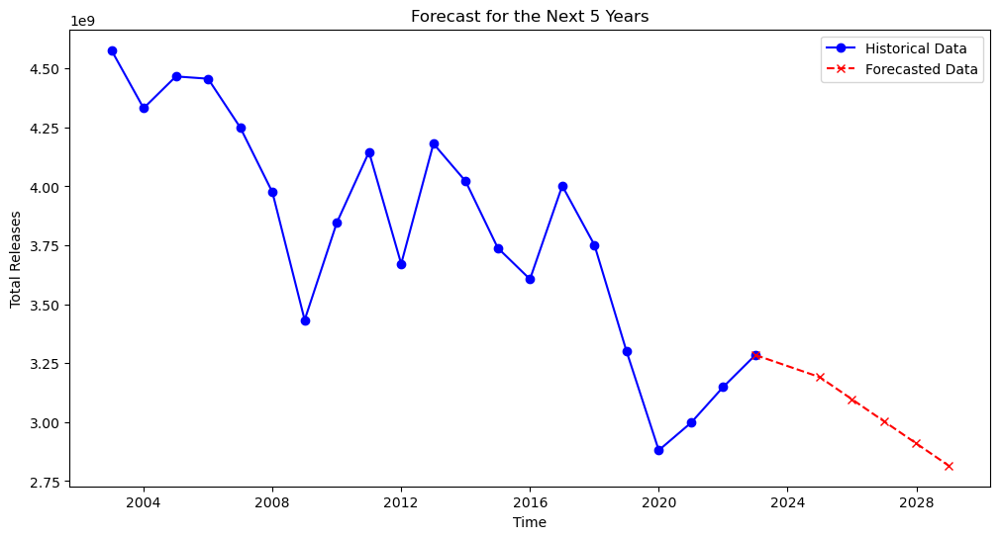

In [138]:
historical_df = time_series_data['TOTAL RELEASES'].dropna().reset_index()
historical_df.columns = ['YEAR', 'ACTUAL']
# Display forecasted values
future_years = pd.date_range(start=time_series_data['TOTAL RELEASES'].dropna().index[-1] + pd.DateOffset(years=1), periods=5, freq='Y')
forecast_df = pd.DataFrame({'YEAR': future_years, 'FORECAST': forecast_original_scale})
print(forecast_df)

plt.figure(figsize=(12, 6))
# Plot historical data
plt.plot(historical_df['YEAR'], historical_df['ACTUAL'], label='Historical Data', marker='o', color='blue')

# Plot forecasted data
plt.plot([historical_df['YEAR'].iloc[-1]] + forecast_df['YEAR'].tolist(), 
         [historical_df['ACTUAL'].iloc[-1]] + forecast_df['FORECAST'].tolist(), 
         label='Forecasted Data', marker='x', linestyle='--', color='red')

plt.title('Forecast for the Next 5 Years')
plt.xlabel('Time')
plt.ylabel('Total Releases')
plt.legend()
plt.show()

In [139]:
from sklearn.model_selection import GridSearchCV

param_grid = {
    'n_estimators': [50, 100, 200],
    'learning_rate': [0.01, 0.1, 0.2],
    'max_depth': [3, 5, 7],
    'subsample': [0.8, 1.0],
    'colsample_bytree': [0.8, 1.0]
}

grid_search = GridSearchCV(
    estimator=XGBRegressor(objective="reg:squarederror"),
    param_grid=param_grid,
    scoring='neg_mean_squared_error',
    cv=3,
    verbose=1
)

grid_search.fit(X_train, y_train)
print("Best Parameters:", grid_search.best_params_)


Fitting 3 folds for each of 108 candidates, totalling 324 fits
Best Parameters: {'colsample_bytree': 1.0, 'learning_rate': 0.01, 'max_depth': 3, 'n_estimators': 100, 'subsample': 1.0}


In [140]:
time_series_data['TOTAL RELEASES']

YEAR
2003-01-01    4.577736e+09
2004-01-01    4.331598e+09
2005-01-01    4.466363e+09
2006-01-01    4.456620e+09
2007-01-01    4.249822e+09
2008-01-01    3.975131e+09
2009-01-01    3.433271e+09
2010-01-01    3.846183e+09
2011-01-01    4.145959e+09
2012-01-01    3.671236e+09
2013-01-01    4.181040e+09
2014-01-01    4.021577e+09
2015-01-01    3.738664e+09
2016-01-01    3.606244e+09
2017-01-01    4.002350e+09
2018-01-01    3.751576e+09
2019-01-01    3.299707e+09
2020-01-01    2.880432e+09
2021-01-01    2.997275e+09
2022-01-01    3.149024e+09
2023-01-01    3.284579e+09
Name: TOTAL RELEASES, dtype: float64

In [141]:
from sklearn.model_selection import GridSearchCV
from lightgbm import LGBMRegressor

# Define the parameter grid
param_grid = {
    'n_estimators': [50, 100, 200],
    'learning_rate': [0.01, 0.1, 0.2],
    'max_depth': [3, 5, 7],
    'num_leaves': [20, 31, 50],
    'subsample': [0.8, 1.0],
    'colsample_bytree': [0.8, 1.0]
}

# Grid search for hyperparameter tuning
grid_search = GridSearchCV(
    estimator=LGBMRegressor(random_state=42),
    param_grid=param_grid,
    scoring='neg_mean_squared_error',
    cv=3,  # 3-fold cross-validation
    verbose=1
)

grid_search.fit(X_train, y_train)
print("Best Parameters:", grid_search.best_params_)


ModuleNotFoundError: No module named 'lightgbm'

In [ ]:
from lightgbm import LGBMRegressor
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_squared_error
import pandas as pd
import numpy as np

# Prepare lagged features
def create_lag_features(data, lag=1):
    """
    Create lagged features for a time series dataset.
    """
    df = pd.DataFrame(data)
    for i in range(1, lag + 1):
        df[f'lag_{i}'] = df[0].shift(i)
    df = df.dropna()
    return df

# Lag settings
lag = 3  # Use the last 3 values to predict the next one
data_lagged = create_lag_features(time_series_data['TOTAL RELEASES_diff'].values, lag)
X = data_lagged.iloc[:, 1:].values  # Lagged features
y = data_lagged.iloc[:, 0].values  # Target variable

# Train-test split
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Hyperparameter tuning for LightGBM
best_rmse_lgb = float('inf')
best_maep_lgb = float('inf')
best_lgb_params = None
best_y_test = best_y_pred = 0

# Hyperparameter grid
learning_rates = [0.01, 0.1, 0.2]
max_depths = [3, 5, 7, 9]
n_estimators = [50, 100, 200]
num_leaves = [20, 31, 50, 100, 150, 200]
subsample = [0.8, 1.0]
colsample_bytree = [0.8, 1.0]

for lr in learning_rates:
    for depth in max_depths:
        for n in n_estimators:
            for leaves in num_leaves:
                for sample in subsample:
                    for colsample in colsample_bytree:
                        try:
                            # Train LightGBM model
                            model = LGBMRegressor(
                                learning_rate=lr, 
                                max_depth=depth, 
                                n_estimators=n, 
                                objective='regression',
                                num_leaves = leaves,
                                subsample=sample,
                                colsample_bytree = colsample,
                                random_state=42
                            )
                            model.fit(X_train, y_train)

                            # Predict on test set
                            y_pred = model.predict(X_test)
                            rmse = np.sqrt(mean_squared_error(y_test, y_pred))
                            maep = error_percentage(y_test, y_pred)

                            # Update best RMSE and parameters
                            if rmse < best_rmse_lgb:
                                best_rmse_lgb = rmse
                                best_maep_lgb = maep
                                best_y_test = y_test
                                best_y_pred = y_pred
                                best_lgb_params = (lr, depth, n, leaves, sample, colsample)

                        except Exception as e:
                            print(f"Error with LightGBM params (lr={lr}, depth={depth}, n_estimators={n}): {e}")
                            continue

print(f"Best LightGBM model with RMSE: {best_rmse_lgb}, MAEP: {best_maep_lgb} and parameters: {best_lgb_params}")


[LightGBM] [Warning] There are no meaningful features which satisfy the provided configuration. Decreasing Dataset parameters min_data_in_bin or min_data_in_leaf and re-constructing Dataset might resolve this warning.
[LightGBM] [Info] Total Bins 0
[LightGBM] [Info] Number of data points in the train set: 13, number of used features: 0
[LightGBM] [Info] Start training from score -28275184.000000
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] Stopped training because there are no more leaves that meet 

In [ ]:
# Forecast future values
last_lag = time_series_data['TOTAL RELEASES_diff'].values[-lag:]  # Last 'lag' values
model = LGBMRegressor(learning_rate=best_lgb_params[0], max_depth=best_lgb_params[1], n_estimators=best_lgb_params[2], 
                      objective='regression', num_leaves = best_lgb_params[3], subsample=best_lgb_params[4],
                      colsample_bytree = best_lgb_params[5], random_state=42)
model.fit(X_train, y_train)
# print(last_lag)
future_forecasts = []
for _ in range(5):  # Forecast 5 future values
    input_data = last_lag[-lag:].reshape(1, -1)
    # print(input_data)
    prediction = model.predict(input_data)[0]
    future_forecasts.append(prediction)
    last_lag = np.append(last_lag, prediction)

print("Forecasted values for next 5 years:", future_forecasts)

[LightGBM] [Warning] There are no meaningful features which satisfy the provided configuration. Decreasing Dataset parameters min_data_in_bin or min_data_in_leaf and re-constructing Dataset might resolve this warning.
[LightGBM] [Info] Total Bins 0
[LightGBM] [Info] Number of data points in the train set: 13, number of used features: 0
[LightGBM] [Info] Start training from score -28275184.000000
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] Stopped training because there are no more leaves that meet 

In [ ]:
# Inverse the differencing to return to the original scale
last_value = time_series_data['TOTAL RELEASES'].iloc[-1]
forecast_original_scale = np.array(future_forecasts).cumsum() + last_value  
forecast_original_scale

array([3.25630426e+09, 3.22802908e+09, 3.19975390e+09, 3.17147871e+09,
       3.14320353e+09])

        YEAR      FORECAST
0 2024-12-31  3.256304e+09
1 2025-12-31  3.228029e+09
2 2026-12-31  3.199754e+09
3 2027-12-31  3.171479e+09
4 2028-12-31  3.143204e+09


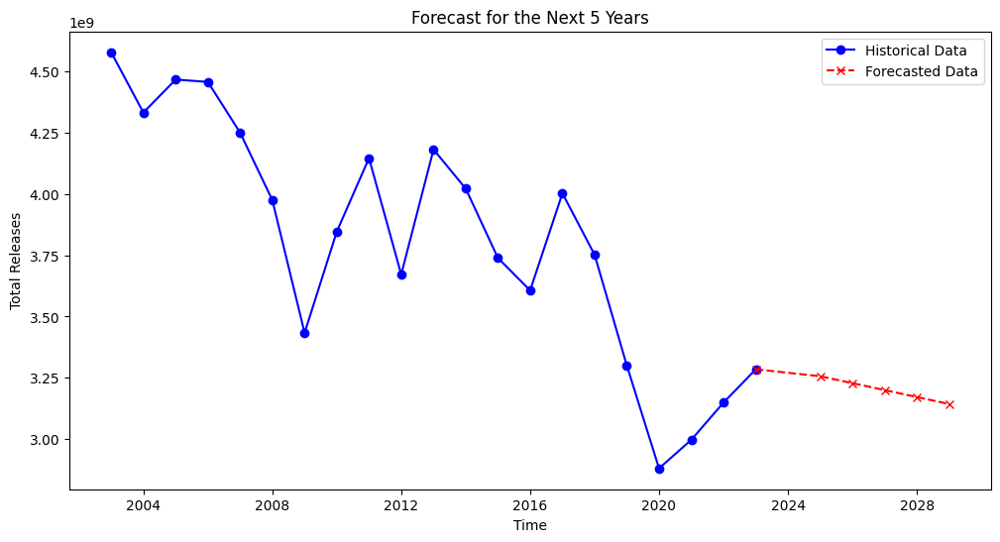

In [ ]:
historical_df = time_series_data['TOTAL RELEASES'].dropna().reset_index()
historical_df.columns = ['YEAR', 'ACTUAL']
# Display forecasted values
future_years = pd.date_range(start=time_series_data['TOTAL RELEASES'].dropna().index[-1] + pd.DateOffset(years=1), periods=5, freq='Y')
forecast_df = pd.DataFrame({'YEAR': future_years, 'FORECAST': forecast_original_scale})
print(forecast_df)

plt.figure(figsize=(12, 6))
# Plot historical data
plt.plot(historical_df['YEAR'], historical_df['ACTUAL'], label='Historical Data', marker='o', color='blue')

# Plot forecasted data
plt.plot([historical_df['YEAR'].iloc[-1]] + forecast_df['YEAR'].tolist(), 
         [historical_df['ACTUAL'].iloc[-1]] + forecast_df['FORECAST'].tolist(), 
         label='Forecasted Data', marker='x', linestyle='--', color='red')

plt.title('Forecast for the Next 5 Years')
plt.xlabel('Time')
plt.ylabel('Total Releases')
plt.legend()
plt.show()

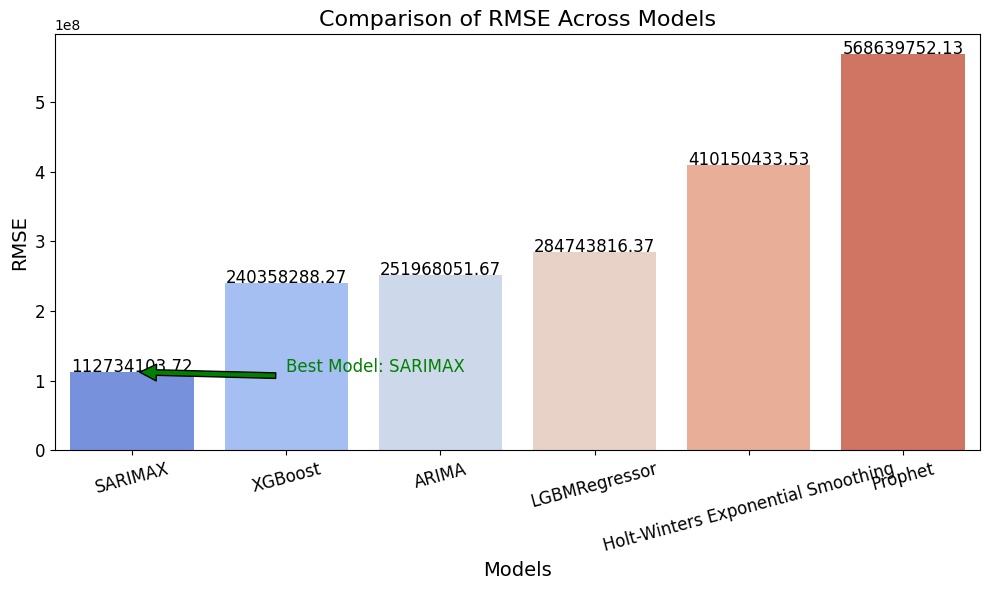

In [ ]:
# RMSE values for each model
models = ['SARIMAX', 'ARIMA', 'Holt-Winters Exponential Smoothing', 'Prophet', 'XGBoost', 'LGBMRegressor']
rmse_values = [best_rmse_SARIMA, best_rmse_ARIMA, best_rmse_hw, best_rmse_prophet, best_rmse_xgb, best_rmse_lgb]  # Replace with your actual RMSE values

# Convert to a dictionary for better readability
model_rmse = dict(zip(models, rmse_values))

# Sort models by RMSE (optional)
sorted_model_rmse = {k: v for k, v in sorted(model_rmse.items(), key=lambda item: item[1])}

# Visualization
plt.figure(figsize=(10, 6))
sns.barplot(x=list(sorted_model_rmse.keys()), y=list(sorted_model_rmse.values()), palette="coolwarm")

# Add RMSE values on top of the bars
for i, v in enumerate(sorted_model_rmse.values()):
    plt.text(i, v + 0.2, f"{v:.2f}", ha='center', fontsize=12, color='black')

# Customize the plot
plt.title('Comparison of RMSE Across Models', fontsize=16)
plt.ylabel('RMSE', fontsize=14)
plt.xlabel('Models', fontsize=14)
plt.xticks(rotation=15, fontsize=12)
plt.yticks(fontsize=12)
plt.tight_layout()

# Highlight the best model (lowest RMSE)
best_model = min(sorted_model_rmse, key=sorted_model_rmse.get)
plt.annotate(f'Best Model: {best_model}', 
             xy=(list(sorted_model_rmse.keys()).index(best_model), sorted_model_rmse[best_model]), 
             xytext=(1, sorted_model_rmse[best_model] + 1), 
             arrowprops=dict(facecolor='green', shrink=0.05), fontsize=12, color='green')

plt.show()
